In [30]:
__version__ = '14'

# %%
import sys
import pandas as pd
from bifacial_peak_shaving import *
from data_processing import *
pd.options.plotting.backend='plotly'

GPU = False
solar_scaler = 1.0

if len(sys.argv) > 1:
    for i,arg in enumerate(sys.argv[1:]):
        if arg == 'GPU':
            GPU = True
        if arg == '-s':
            solar_scaler = float(sys.argv[i+2])

output_filename_stub = f'Output/caltech_ev_mjw{__version__}_solar{solar_scaler:.1f}x_'

if GPU:
    data_dir = r'C:/Users/Admin/OneDrive - Politecnico di Milano/Data'
    output_filename_stub += 'GPU_'
else:
    data_dir = r'~/OneDrive/Data'

# Data

## Load

/tmp/ipykernel_200628/1488207461.py:17: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 29184 entries, 2018-05-01 00:00:00 to 2019-02-28 23:45:00
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Load (kW)  29184 non-null  float64
dtypes: float64(1)
memory usage: 456.0 KB
None
          Load (kW)
count  29184.000000
mean      21.240250
std       20.452856
min        0.000000
25%        4.942236
50%       14.632581
75%       33.154909
max      117.733400


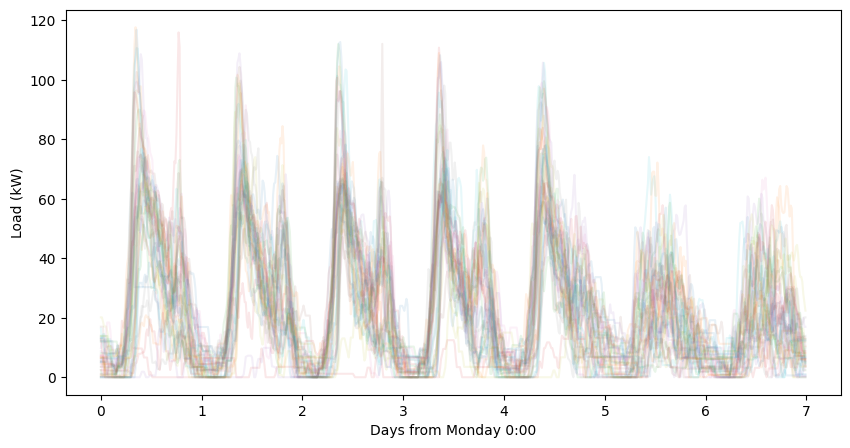

In [31]:
load_file = r'/Load/Vehicle/ACN/old/acn_caltech.csv'

#shutil.copyfile(data_dir+load_file, r'./Data/'+load_file.split('/')[-1])

load = pd.read_csv(data_dir + r'/Load/Vehicle/ACN/old/acn_caltech.csv',
                   index_col=0,
                   parse_dates=True,
                   comment='#',)
                    #.resample('1h').mean()\
                    #.fillna(method='ffill')
                    #.loc['2018-4-26':'2019-3-22']
#load = pd.DataFrame({'Load (kW)':list(load.loc['2019-1-2 0:00':'2019-1-2 16:00','Load (kW)'])+list(load.loc[:,'Load (kW)'])},
#                     index=pd.date_range('2019-1-1 0:00',periods=8760,freq='1h'))
#load.loc['2019-5-20'] = load.loc['2019-5-22'].values
#load.loc['2019-5-21'] = load.loc['2019-5-22'].values
#load.index = pd.date_range('1901-1-1 0:00',periods=35040,freq='15min')
load = load.fillna(method='ffill')
#interval_min = int(load.index.to_series().diff().mean().seconds/60)
#load = load.resample('30min').mean()
load = load.loc['2018-5-1':'2019-2-28']
print(load.info())
print(load.describe())

# upsample
# load = load.resample('5min').interpolate(method='linear')
# load.loc[len(load)] = [pd.NA]
# load.index = list(load.index[:-1]) + [load.index[-2]+pd.Timedelta('5min')]
# load.loc[len(load)] = [pd.NA]
# load.index = list(load.index[:-1]) + [load.index[-2]+pd.Timedelta('5min')]
# load = load.fillna(method='ffill')

plot_weekly(load['Load (kW)'])
load.plot()

## Solar

- 7 kWp, TMY

- Net zero capacity

  - $capacity[kWp] = production[kWh] \times yield [\frac{kWh}{kWp}]^{-1}$

In [32]:
solar_angles = ['s20','w90','s20w90_25_75','s20w90_50_50','s20w90_75_25']

dir_solar = data_dir + r'/Solar/Modelled/'

s20 = pd.concat((pd.read_csv(dir_solar+'pasadena_2018_15min_367mods_s20.csv',index_col=0,parse_dates=True,comment='#'),
                 pd.read_csv(dir_solar+'pasadena_2019_15min_367mods_s20.csv',index_col=0,parse_dates=True,comment='#')))

w90 = pd.concat((pd.read_csv(dir_solar+'pasadena_2018_15min_367mods_w90.csv',index_col=0,parse_dates=True,comment='#'),
                 pd.read_csv(dir_solar+'pasadena_2019_15min_367mods_w90.csv',index_col=0,parse_dates=True,comment='#')))

s20w90 = pd.concat((pd.read_csv(dir_solar+'pasadena_2018_15min_367mods_s20w90.csv',index_col=0,parse_dates=True,comment='#'),
                    pd.read_csv(dir_solar+'pasadena_2019_15min_367mods_s20w90.csv',index_col=0,parse_dates=True,comment='#')))


s20w90_25_75 = 0.25*s20 + 0.75*w90
s20w90_50_50 = 0.50*s20 + 0.50*w90
s20w90_75_25 = 0.75*s20 + 0.25*w90

solar = pd.concat((s20,w90,s20w90_25_75, s20w90_50_50, s20w90_75_25 ),axis=1)
solar.columns=solar_angles

#solar = solar.resample('1h').mean()



#net_zero_capacity = load['Load (kW)'].sum() / (solar.s20.sum()) # load=production / yield
#solar = solar * net_zero_capacity # scale to net 0


# upsample
# solar = solar.resample('5min').interpolate(method='linear')
# for _ in range(2):
#     solar.loc[len(solar)] = [pd.NA]*len(solar.columns)
#     solar.index = list(solar.index[:-1]) + [solar.index[-2]+pd.Timedelta('5min')]
# solar = solar.fillna(method='ffill')

solar = solar.loc[load.index] # make same length as load

print(solar.info(),'\n')
print(solar.describe())
solar

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 29184 entries, 2018-05-01 00:00:00 to 2019-02-28 23:45:00
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   s20           29184 non-null  float64
 1   w90           29184 non-null  float64
 2   s20w90_25_75  29184 non-null  float64
 3   s20w90_50_50  29184 non-null  float64
 4   s20w90_75_25  29184 non-null  float64
dtypes: float64(5)
memory usage: 1.3 MB
None 

                s20           w90  s20w90_25_75  s20w90_50_50  s20w90_75_25
count  29184.000000  29184.000000  29184.000000  29184.000000  29184.000000
mean      20.788035     17.944883     18.655671     19.366459     20.077247
std       28.877936     24.015755     23.644682     24.413909     26.223278
min       -0.067293     -0.055873     -0.022939     -0.037724     -0.052508
25%       -0.008155     -0.008155     -0.008155     -0.008155     -0.008155
50%       -0.008155     -0.008155     -0.008155     -

,s20,w90,s20w90_25_75,s20w90_50_50,s20w90_75_25
Datetime (PST),,,,,
2018-05-01 00:00:00,-0.008155,-0.008155,-0.008155,-0.008155,-0.008155
2018-05-01 00:15:00,-0.008155,-0.008155,-0.008155,-0.008155,-0.008155
2018-05-01 00:30:00,-0.008155,-0.008155,-0.008155,-0.008155,-0.008155
2018-05-01 00:45:00,-0.008155,-0.008155,-0.008155,-0.008155,-0.008155
2018-05-01 01:00:00,-0.008155,-0.008155,-0.008155,-0.008155,-0.008155
...,...,...,...,...,...
2019-02-28 22:45:00,-0.008155,-0.008155,-0.008155,-0.008155,-0.008155
2019-02-28 23:00:00,-0.008155,-0.008155,-0.008155,-0.008155,-0.008155
2019-02-28 23:15:00,-0.008155,-0.008155,-0.008155,-0.008155,-0.008155


Solar energy

In [33]:
solar.resample('1h').mean().sum()

s20             151669.506467
w90             130925.865292
s20w90_25_75    136111.775586
s20w90_50_50    141297.685879
s20w90_75_25    146483.596173
dtype: float64

Solar yield

In [34]:
solar.resample('1h').mean().sum()/(367*0.350)

s20             1180.766886
w90             1019.274934
s20w90_25_75    1059.647922
s20w90_50_50    1100.020910
s20w90_75_25    1140.393898
dtype: float64

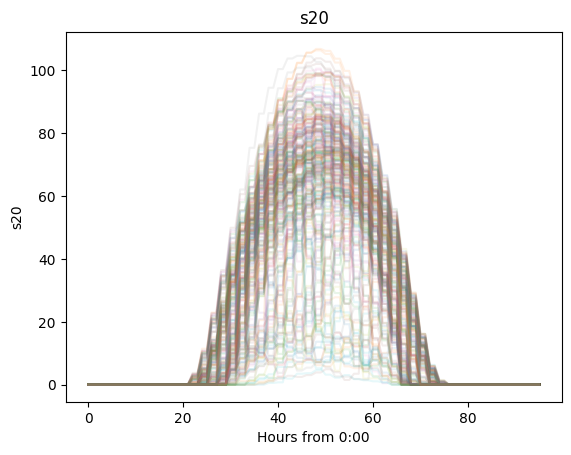

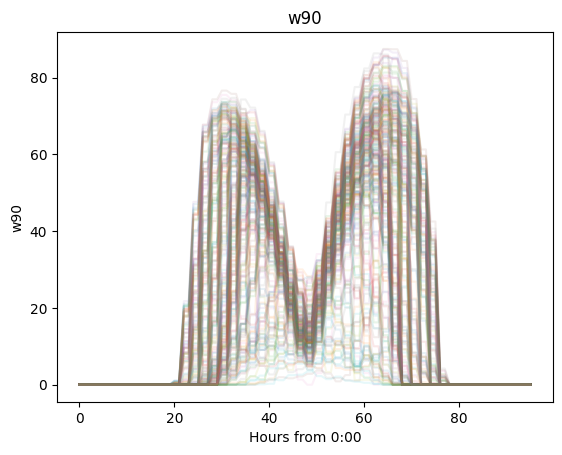

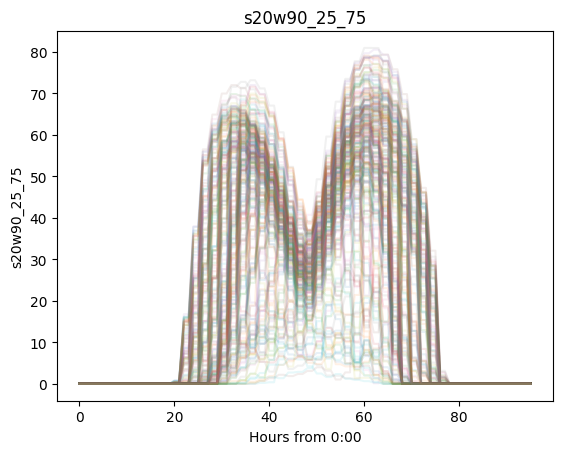

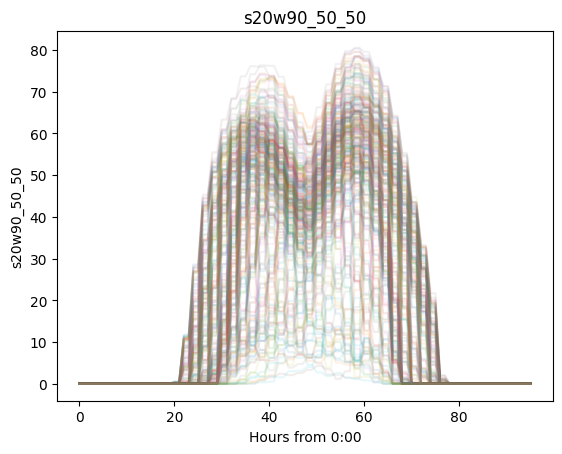

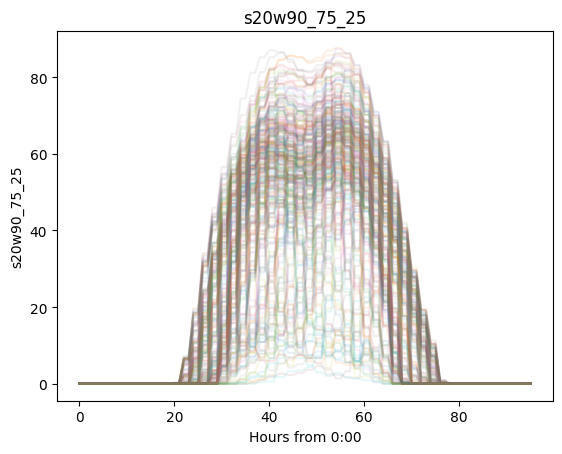

In [35]:
for col in solar:
    plot_daily(solar[col],title=col,interval_min=15)

## Net load

In [36]:
solar.index = load.index # seems unnecessary
df = pd.concat((load,solar),axis=1)
df.columns = ['load'] + ['solar_'+x for x in solar.columns]
for angle in solar.columns:
    df[f'netload_{angle}'] = df['load'] - solar[angle]

load v s20

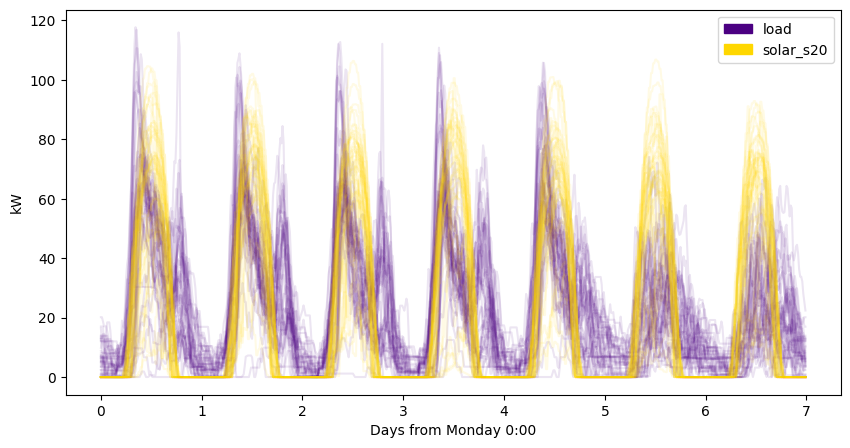

In [37]:
l = df['load']
s = df['solar_s20']
plot_weekly((l,s),ylabel='kW')

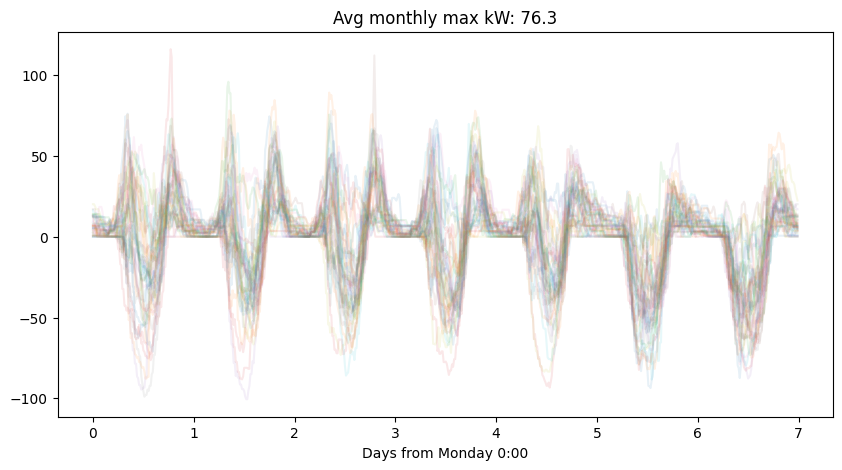

In [38]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('15min').mean().resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w90

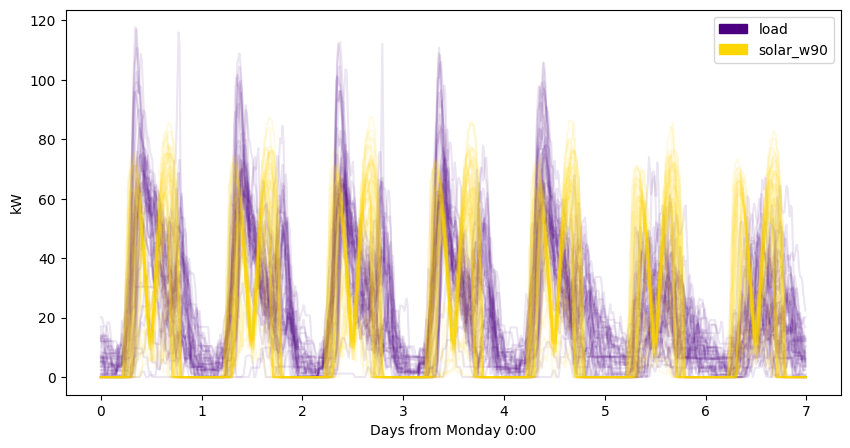

In [39]:
l = df['load']
s = df['solar_w90']
plot_weekly((l,s),ylabel='kW')

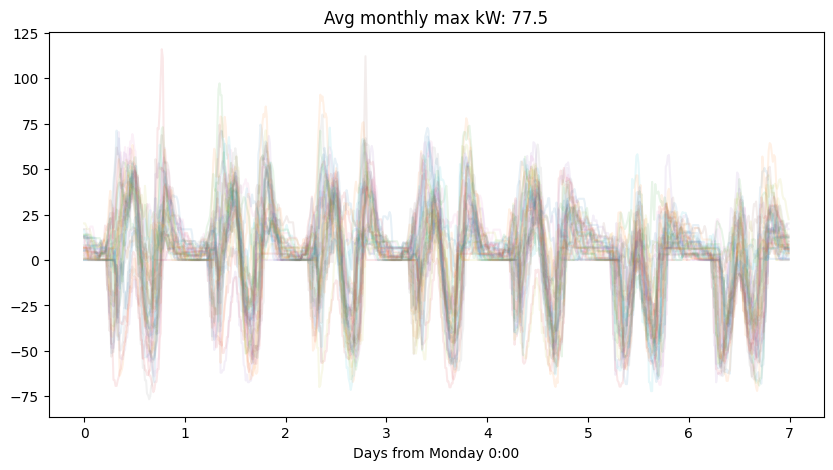

In [40]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('15min').mean().resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v s20w90_50_50

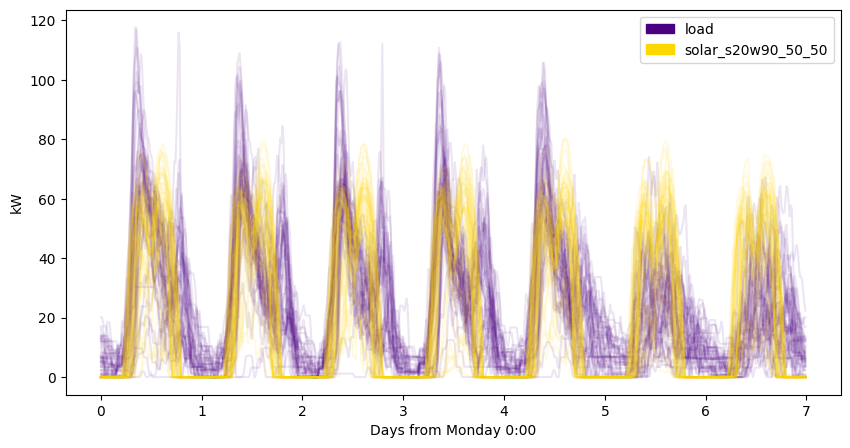

In [41]:
l = df['load']
s = df['solar_s20w90_50_50']
plot_weekly((l,s),ylabel='kW')

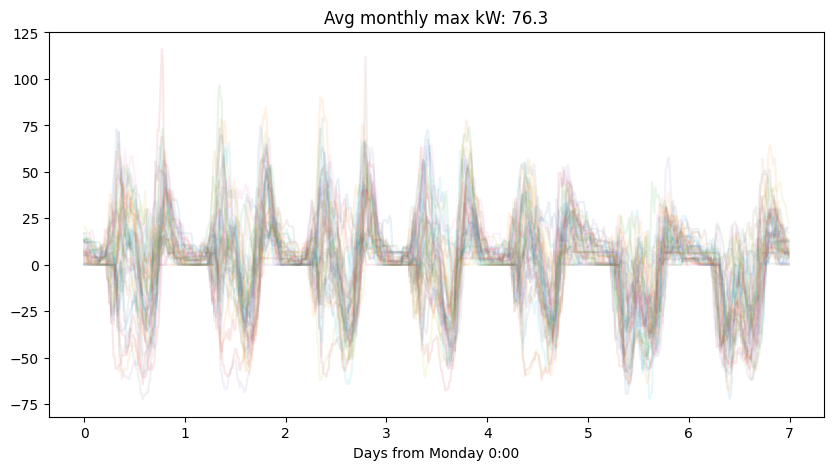

In [42]:
l = df['load']
s = df['solar_s20w90_50_50']
avg_monthly_max = (l - s).resample('15min').mean().resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

# Baseline Costs

Load only, and net load given various solar

In [43]:
tou = TimeOfUseTariff(
   [{'months':[6,7,8,9],        'name':'All Hours sum',     'power_price':26.07,    'energy_price':0,       'hours':h((0,24))           },
    {'months':[6,7,8,9],        'name':'Off Peak sum',      'power_price':    0,    'energy_price':0.132,   'hours':h((0,14), (23,24)) },
    {'months':[6,7,8,9],        'name':'Partial Peak sum',  'power_price': 6.81,    'energy_price':0.159,   'hours':h((14,16),(21,23)) },
    {'months':[6,7,8,9],        'name':'Peak sum',          'power_price':32.90,    'energy_price':0.196,   'hours':h((16,21)) },
    {'months':[1,2,10,11,12],   'name':'All Hours win',     'power_price':26.07,    'energy_price':0,       'hours':h((0,24)) },
    {'months':[1,2,10,11,12],   'name':'Off Peak win',      'power_price':    0,    'energy_price':0.132,   'hours':h((0,14), (23,24)) },
    {'months':[1,2,10,11,12],   'name':'Partial Peak win',  'power_price':    0,    'energy_price':     0,  'hours':h((14,16),(21,23)) },
    {'months':[1,2,10,11,12],   'name':'Peak win',          'power_price': 2.20,    'energy_price':0.172,   'hours':h((16,21)) },
    {'months':[3,4,5],          'name':'All Hours spr',     'power_price':26.07,    'energy_price':0,       'hours':h((0,24)) },
    {'months':[3,4,5],          'name':'Super Off Peak spr','power_price':    0,    'energy_price':0.079,   'hours':h((9,14))},
    {'months':[3,4,5],          'name':'Off Peak spr',      'power_price':    0,    'energy_price':0.132,   'hours':h((0,9),  (14,16), (21,24)) },
    {'months':[3,4,5],          'name':'Peak spr',          'power_price': 2.20,    'energy_price':0.172,   'hours':h((16,21)) },                     ])

Tariff check: ok
Periods: 12 (overlap True)
Levels: 4


In [44]:
all_cost = {}

# # load
# cost = 0
# for year in df.index.year.unique():
#     df_year = df[df.index.year==year]
#     for month in df_year.index.month.unique():
#         df_month = df_year[df_year.index.month==month]
#         cost += calc_cost(df_month['load'],real_TOU)
# all_cost['load'] = round(cost,0)

# # net load for each solar case

load_cols = ['load'] + [f'netload_{angle}' for angle in solar_angles]

for load_col in load_cols:
    cost = 0
    for year in df.index.year.unique():
        df_year = df[df.index.year==year]
        for month in df_year.index.month.unique():
            df_month = df_year[df_year.index.month==month]
            cost += calc_cost(df_month[load_col],tou)
    all_cost[load_col] = round(cost,0)

all_cost

{'load': 54242.0,
 'netload_s20': 35971.0,
 'netload_w90': 36985.0,
 'netload_s20w90_25_75': 35998.0,
 'netload_s20w90_50_50': 35545.0,
 'netload_s20w90_75_25': 35556.0}

# Monthly Peaks

## Single TOU

In [45]:
df

,load,solar_s20,solar_w90,solar_s20w90_25_75,solar_s20w90_50_50,solar_s20w90_75_25,netload_s20,netload_w90,netload_s20w90_25_75,netload_s20w90_50_50,netload_s20w90_75_25
Datetime (PST),,,,,,,,,,,
2018-05-01 00:00:00,3.013458,-0.008155,-0.008155,-0.008155,-0.008155,-0.008155,3.021613,3.021613,3.021613,3.021613,3.021613
2018-05-01 00:15:00,3.013458,-0.008155,-0.008155,-0.008155,-0.008155,-0.008155,3.021613,3.021613,3.021613,3.021613,3.021613
2018-05-01 00:30:00,3.013458,-0.008155,-0.008155,-0.008155,-0.008155,-0.008155,3.021613,3.021613,3.021613,3.021613,3.021613
2018-05-01 00:45:00,3.013458,-0.008155,-0.008155,-0.008155,-0.008155,-0.008155,3.021613,3.021613,3.021613,3.021613,3.021613
2018-05-01 01:00:00,3.013458,-0.008155,-0.008155,-0.008155,-0.008155,-0.008155,3.021613,3.021613,3.021613,3.021613,3.021613
...,...,...,...,...,...,...,...,...,...,...,...
2019-02-28 22:45:00,4.867047,-0.008155,-0.008155,-0.008155,-0.008155,-0.008155,4.875202,4.875202,4.875202,4.875202,4.875202
2019-02-28 23:00:00,4.867047,-0.008155,-0.008155,-0.008155,-0.008155,-0.008155,4.875202,4.875202,4.875202,4.875202,4.875202
2019-02-28 23:15:00,4.867047,-0.008155,-0.008155,-0.008155,-0.008155,-0.008155,4.875202,4.875202,4.875202,4.875202,4.875202


In [46]:
peak_begin,peak_end = 8,11
angle = 's20'
peaks = calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)
peaks

,netload_s20 kw,netload_s20 t
0,56.8,2018-05-22 09:15:00
1,44.8,2018-06-06 08:15:00
2,68.4,2018-07-06 10:00:00
3,57.3,2018-08-20 08:00:00
4,77.9,2018-09-05 08:45:00
5,95.9,2018-10-09 08:15:00
6,63.0,2018-11-29 10:00:00
7,72.2,2018-12-06 09:45:00
8,64.0,2019-01-17 10:30:00
9,67.2,2019-02-14 09:45:00


In [47]:
peak_begin,peak_end = 8,11
angle = 's20'
peaks = calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)

# angle = 'w20'
# peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
# peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 'w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 's20w90_50_50'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

#print('Avg w20 reduction',peaks['netload_s20->w20 reduc kw'].mean())
print('Avg w90 reduction',peaks['netload_s20->w90 reduc kw'].mean())
print('Avg s20w90_50_50 reduction',peaks['netload_s20->s20w90_50_50 reduc kw'].mean())
peaks

Avg w90 reduction -0.23999999999999916
Avg s20w90_50_50 reduction 0.43000000000000116


,netload_s20 kw,netload_s20 t,netload_w90 kw,netload_w90 t,netload_s20->w90 reduc kw,netload_s20w90_50_50 kw,netload_s20w90_50_50 t,netload_s20->s20w90_50_50 reduc kw
0,56.8,2018-05-22 09:15:00,59.3,2018-05-22 09:15:00,-2.5,58.0,2018-05-22 09:15:00,-1.2
1,44.8,2018-06-06 08:15:00,47.5,2018-06-06 08:15:00,-2.7,46.1,2018-06-06 08:15:00,-1.3
2,68.4,2018-07-06 10:00:00,47.7,2018-07-23 10:30:00,20.7,56.8,2018-07-06 10:00:00,11.6
3,57.3,2018-08-20 08:00:00,59.3,2018-08-27 08:45:00,-2.0,58.2,2018-08-20 08:00:00,-0.9
4,77.9,2018-09-05 08:45:00,80.0,2018-09-05 08:45:00,-2.1,78.9,2018-09-05 08:45:00,-1.0
5,95.9,2018-10-09 08:15:00,97.2,2018-10-09 08:15:00,-1.3,96.5,2018-10-09 08:15:00,-0.6
6,63.0,2018-11-29 10:00:00,72.8,2018-11-28 10:30:00,-9.8,63.9,2018-11-29 10:00:00,-0.9
7,72.2,2018-12-06 09:45:00,72.7,2018-12-06 09:45:00,-0.5,72.5,2018-12-06 09:45:00,-0.3
8,64.0,2019-01-17 10:30:00,65.4,2019-01-17 10:30:00,-1.4,64.7,2019-01-17 10:30:00,-0.7
9,67.2,2019-02-14 09:45:00,68.0,2019-02-14 09:45:00,-0.8,67.6,2019-02-14 09:45:00,-0.4


## Variable TOU

BROKEN!

w20

In [48]:
# angle1 = 's20'
# angle2 = 'w20'

# peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
# peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.1]

w90

In [49]:
angle1 = 's20'
angle2 = 'w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>5]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
64,15,18,28.2,5.7,-1.2
68,16,18,28.2,6.0,-1.2


s20w90

In [50]:
angle1 = 's20'
angle2 = 's20w90_50_50'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>2]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
9,8,19,17.1,2.4,-1.2
20,9,19,17.1,2.5,-1.2
29,10,18,11.6,2.1,-1.4
30,10,19,17.1,2.5,-1.4
46,12,18,14.8,2.2,-4.7
53,13,18,16.8,3.3,-1.4
54,13,19,17.1,2.1,-1.4
58,14,17,16.2,2.1,-1.4
59,14,18,16.8,3.3,-1.4
60,14,19,17.1,2.1,-1.4


Best for w90

In [51]:
#df.loc['2022-6-28':'2022-6-30'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

In [52]:
#df.loc['2022-3-5':'2022-3-7'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

Largest spread w90 v s20w90

In [53]:
#df.loc['2022-10-12':'2022-10-14'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

# Peak Shaving

s20

In [25]:
angle = 's20'
thresholds = (16,16,16,13)
batt_kwh = 125
year,month,day = 2018,6,6
title='Single Day of Peak Shaving<br>Solar South 20°, Battery 125 kWh'

fail,dispatch = peak_shaving_sim_4tou(  df[['load',f'solar_{angle}',f'netload_{angle}']]\
                                   .loc[f'{year}-{month}'],
                                   f'netload_{angle}',
                                   batt_kwh,
                                   thresholds,
                                   tou.get(month),
                                   utility_chg_max=batt_kwh,)

cost = calc_cost(dispatch.utility,tou)

plotly_stacked_4tou( dispatch.drop(columns=['soc']).loc[f'{year}-{month}-{day}'],
                solar=f'solar_{angle}',
                threshold0=thresholds[0], threshold0_h=tou.get(month)[0]['hours'], threshold0_name=f'Threshold "All Hours" {thresholds[0]:.1f} kW',                     
                #threshold1=thresholds[1], threshold1_h=real_TOU[1]['hours'], threshold1_name=f'Threshold "Off Peak" {thresholds[1]:.1f} kW',
                threshold1=thresholds[2], threshold1_h=tou.get(month)[2]['hours'], threshold1_name=f'Threshold "Partial Peak" {thresholds[2]:.1f} kW',                          
                threshold2=thresholds[3], threshold2_h=tou.get(month)[3]['hours'], threshold2_name=f'Threshold "Peak" {thresholds[3]:.1f} kW',                          
                #title=f'Cost {cost:.1f} ' + {True:'- Failure',False:''}[fail],
                title=title,
                units_power='kW',
                size=(800,500),
                ylim=(0,101),
                upsample_min=1,
                template='plotly_dark',)

/home/mjw/Code/Bifacial-solar-and-peakshaving/data_processing.py:850: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



s20w90 25 75

In [54]:
angle = 's20w90_25_75'
thresholds = (12,12,11,5)
batt_kwh = 125
year,month,day = 2018,6,6
title='Single Day of Peak Shaving<br>Solar West 90°, Battery 125 kWh'

fail,dispatch = peak_shaving_sim_4tou(  df[['load',f'solar_{angle}',f'netload_{angle}']]\
                                   .loc[f'{year}-{month}'],
                                   f'netload_{angle}',
                                   batt_kwh,
                                   thresholds,
                                   tou.get(month),
                                   utility_chg_max=batt_kwh,)

cost = calc_cost(dispatch.utility,tou)

plotly_stacked_4tou( dispatch.drop(columns=['soc']).loc[f'{year}-{month}-{day}'],
                solar=f'solar_{angle}',
                threshold0=thresholds[0], threshold0_h=tou.get(month)[0]['hours'], threshold0_name=f'Threshold "All Hours" {thresholds[0]:.1f} kW',                     
                #threshold1=thresholds[1], threshold1_h=real_TOU[1]['hours'], threshold1_name=f'Threshold "Off Peak" {thresholds[1]:.1f} kW',
                threshold1=thresholds[2], threshold1_h=tou.get(month)[2]['hours'], threshold1_name=f'Threshold "Partial Peak" {thresholds[2]:.1f} kW',                          
                threshold2=thresholds[3], threshold2_h=tou.get(month)[3]['hours'], threshold2_name=f'Threshold "Peak" {thresholds[3]:.1f} kW',                          
                #title=f'Cost {cost:.1f} ' + {True:'- Failure',False:''}[fail],
                title=title,
                units_power='kW',
                size=(800,500),
                ylim=(0,101),
                upsample_min=1,
                template='plotly_dark',)

/home/mjw/Code/Bifacial-solar-and-peakshaving/data_processing.py:850: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



In [28]:
dispatch.sum()

load                     67721.315621
solar_s20w90_25_75       71482.126595
netload_s20w90_25_75     -3760.810974
batt                     -2230.566671
soe                     270825.110757
utility                  -1530.244303
soc                       2166.600886
dtype: float64

## Minimize Cost

Grid search rough, fine, and gradient descent

In [31]:
#angles = ['s20','s20w90_75_25','s20w90_50_50','s20w90_25_75','w90']
#batt_kwhs = [25,50,75,100,125,150,200,400,600]

angles = ['s20','w90']
batt_kwhs = [25]

optimize_thresholds(df,tou,angles,batt_kwhs,output_filename_stub)


2023-12-13 12:32:40.979032 Angle s20 batt_kwh 25 begin new month 2018-5
2023-12-13 12:32:54.510558 (+13s) Rough grid search done for 2018-5 thresholds=(40.0,40.0,40.0,40.0), cost=2118.3 
2023-12-13 12:33:36.419715 (+41s) Fine grid search done for 2018-5 thresholds=(40.0,40.0,40.0,40.0), cost=2118.3 


/home/mjw/Code/Bifacial-solar-and-peakshaving/bifacial_peak_shaving.py:653: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



2023-12-13 12:33:52.970665 (+16s) Gradient descent done for 2018-5 thresholds=(40.0,40.0,40.0,39.9), cost=2117.6 

2023-12-13 12:33:52.971620 Angle s20 batt_kwh 25 begin new month 2018-6
2023-12-13 12:34:07.402355 (+14s) Rough grid search done for 2018-6 thresholds=(50.0,50.0,50.0,50.0), cost=4147.0 
2023-12-13 12:34:56.742237 (+49s) Fine grid search done for 2018-6 thresholds=(46.0,46.0,45.0,45.0), cost=3852.7 


/home/mjw/Code/Bifacial-solar-and-peakshaving/bifacial_peak_shaving.py:653: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



2023-12-13 12:35:17.114473 (+20s) Gradient descent done for 2018-6 thresholds=(47.6,47.6,46.6,44.2), cost=3821.5 

2023-12-13 12:35:17.115296 Angle s20 batt_kwh 25 begin new month 2018-7
2023-12-13 12:35:32.396632 (+15s) Rough grid search done for 2018-7 thresholds=(60.0,60.0,60.0,60.0), cost=5075.6 
2023-12-13 12:36:22.462296 (+50s) Fine grid search done for 2018-7 thresholds=(53.0,53.0,51.0,51.0), cost=4597.4 


/home/mjw/Code/Bifacial-solar-and-peakshaving/bifacial_peak_shaving.py:653: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



2023-12-13 12:36:48.478239 (+26s) Gradient descent done for 2018-7 thresholds=(50.1,50.1,50.1,50.1), cost=4509.4 

2023-12-13 12:36:48.479212 Angle s20 batt_kwh 25 begin new month 2018-8
2023-12-13 12:37:02.746526 (+14s) Rough grid search done for 2018-8 thresholds=(90.0,90.0,90.0,90.0), cost=5157.8 
2023-12-13 12:37:51.095280 (+48s) Fine grid search done for 2018-8 thresholds=(98.0,98.0,98.0,98.0), cost=5157.7 


/home/mjw/Code/Bifacial-solar-and-peakshaving/bifacial_peak_shaving.py:653: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



2023-12-13 12:39:09.484351 (+78s) Gradient descent done for 2018-8 thresholds=(113.1,113.1,112.2,112.4), cost=5157.6 

2023-12-13 12:39:09.485368 Angle s20 batt_kwh 25 begin new month 2018-9
2023-12-13 12:39:26.346803 (+16s) Rough grid search done for 2018-9 thresholds=(60.0,60.0,60.0,60.0), cost=5188.6 
2023-12-13 12:40:12.344602 (+45s) Fine grid search done for 2018-9 thresholds=(56.0,56.0,55.0,55.0), cost=4961.6 


/home/mjw/Code/Bifacial-solar-and-peakshaving/bifacial_peak_shaving.py:653: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



2023-12-13 12:40:37.494618 (+25s) Gradient descent done for 2018-9 thresholds=(55.0,55.0,55.0,55.0), cost=4935.1 

2023-12-13 12:40:37.495288 Angle s20 batt_kwh 25 begin new month 2018-10
2023-12-13 12:40:53.575228 (+16s) Rough grid search done for 2018-10 thresholds=(80.0,80.0,80.0,80.0), cost=3772.4 
2023-12-13 12:41:45.310672 (+51s) Fine grid search done for 2018-10 thresholds=(80.0,80.0,80.0,80.0), cost=3772.4 


/home/mjw/Code/Bifacial-solar-and-peakshaving/bifacial_peak_shaving.py:653: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



2023-12-13 12:42:10.024334 (+24s) Gradient descent done for 2018-10 thresholds=(79.8,79.8,79.8,79.8), cost=3766.2 

2023-12-13 12:42:10.025495 Angle s20 batt_kwh 25 begin new month 2018-11
2023-12-13 12:42:26.937967 (+16s) Rough grid search done for 2018-11 thresholds=(50.0,50.0,30.0,30.0), cost=1894.5 
2023-12-13 12:43:18.129335 (+51s) Fine grid search done for 2018-11 thresholds=(46.0,46.0,26.0,23.0), cost=1769.3 


/home/mjw/Code/Bifacial-solar-and-peakshaving/bifacial_peak_shaving.py:653: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



2023-12-13 12:43:32.473735 (+14s) Gradient descent done for 2018-11 thresholds=(43.4,43.4,27.7,23.7), cost=1702.3 

2023-12-13 12:43:32.474488 Angle s20 batt_kwh 25 begin new month 2018-12
2023-12-13 12:43:47.382537 (+14s) Rough grid search done for 2018-12 thresholds=(60.0,60.0,40.0,30.0), cost=2092.7 
2023-12-13 12:44:36.067415 (+48s) Fine grid search done for 2018-12 thresholds=(53.0,53.0,34.0,24.0), cost=1894.6 


/home/mjw/Code/Bifacial-solar-and-peakshaving/bifacial_peak_shaving.py:653: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



2023-12-13 12:44:48.651186 (+12s) Gradient descent done for 2018-12 thresholds=(51.5,51.5,34.9,24.5), cost=1857.6 

2023-12-13 12:44:48.652219 Angle s20 batt_kwh 25 begin new month 2019-1
2023-12-13 12:45:03.720539 (+15s) Rough grid search done for 2019-1 thresholds=(50.0,50.0,40.0,30.0), cost=1908.9 
2023-12-13 12:45:52.144120 (+48s) Fine grid search done for 2019-1 thresholds=(46.0,46.0,38.0,22.0), cost=1780.9 


/home/mjw/Code/Bifacial-solar-and-peakshaving/bifacial_peak_shaving.py:653: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



2023-12-13 12:46:01.193101 (+9s) Gradient descent done for 2019-1 thresholds=(45.9,45.9,38.3,22.2), cost=1779.1 

2023-12-13 12:46:01.193949 Angle s20 batt_kwh 25 begin new month 2019-2
2023-12-13 12:46:15.391783 (+14s) Rough grid search done for 2019-2 thresholds=(50.0,50.0,40.0,30.0), cost=1787.7 
2023-12-13 12:47:04.993828 (+49s) Fine grid search done for 2019-2 thresholds=(49.0,49.0,30.0,21.0), cost=1737.4 


/home/mjw/Code/Bifacial-solar-and-peakshaving/bifacial_peak_shaving.py:653: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



2023-12-13 12:47:18.259768 (+13s) Gradient descent done for 2019-2 thresholds=(46.4,46.4,31.9,21.0), cost=1671.2 

2023-12-13 12:47:18.262107 Angle w90 batt_kwh 25 begin new month 2018-5
2023-12-13 12:47:33.208279 (+14s) Rough grid search done for 2018-5 thresholds=(50.0,50.0,50.0,40.0), cost=2310.8 
2023-12-13 12:48:15.524163 (+42s) Fine grid search done for 2018-5 thresholds=(43.0,43.0,43.0,40.0), cost=2128.6 


/home/mjw/Code/Bifacial-solar-and-peakshaving/bifacial_peak_shaving.py:653: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



2023-12-13 12:48:28.031605 (+12s) Gradient descent done for 2018-5 thresholds=(41.8,41.8,41.8,40.6), cost=2098.9 

2023-12-13 12:48:28.032324 Angle w90 batt_kwh 25 begin new month 2018-6
2023-12-13 12:48:40.672892 (+12s) Rough grid search done for 2018-6 thresholds=(40.0,40.0,40.0,40.0), cost=3609.3 
2023-12-13 12:49:18.475680 (+37s) Fine grid search done for 2018-6 thresholds=(39.0,39.0,38.0,38.0), cost=3504.0 


/home/mjw/Code/Bifacial-solar-and-peakshaving/bifacial_peak_shaving.py:653: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



2023-12-13 12:49:28.153924 (+9s) Gradient descent done for 2018-6 thresholds=(38.7,38.7,38.0,37.1), cost=3466.9 

2023-12-13 12:49:28.154803 Angle w90 batt_kwh 25 begin new month 2018-7
2023-12-13 12:49:39.987376 (+11s) Rough grid search done for 2018-7 thresholds=(50.0,50.0,50.0,50.0), cost=4470.9 
2023-12-13 12:50:18.528065 (+38s) Fine grid search done for 2018-7 thresholds=(49.0,49.0,49.0,47.0), cost=4359.4 


/home/mjw/Code/Bifacial-solar-and-peakshaving/bifacial_peak_shaving.py:653: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



2023-12-13 12:50:54.643296 (+36s) Gradient descent done for 2018-7 thresholds=(46.5,46.5,46.5,46.5), cost=4286.3 

2023-12-13 12:50:54.644326 Angle w90 batt_kwh 25 begin new month 2018-8
2023-12-13 12:51:06.928455 (+12s) Rough grid search done for 2018-8 thresholds=(90.0,90.0,90.0,90.0), cost=5169.8 
2023-12-13 12:51:48.273496 (+41s) Fine grid search done for 2018-8 thresholds=(98.0,98.0,98.0,98.0), cost=5169.7 


/home/mjw/Code/Bifacial-solar-and-peakshaving/bifacial_peak_shaving.py:653: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



2023-12-13 12:52:42.980069 (+54s) Gradient descent done for 2018-8 thresholds=(112.9,112.9,112.6,112.2), cost=5169.6 

2023-12-13 12:52:42.980717 Angle w90 batt_kwh 25 begin new month 2018-9
2023-12-13 12:52:55.395777 (+12s) Rough grid search done for 2018-9 thresholds=(60.0,60.0,60.0,60.0), cost=5251.6 
2023-12-13 12:53:35.537849 (+40s) Fine grid search done for 2018-9 thresholds=(56.0,56.0,54.0,54.0), cost=4989.0 


/home/mjw/Code/Bifacial-solar-and-peakshaving/bifacial_peak_shaving.py:653: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



2023-12-13 12:53:48.577867 (+13s) Gradient descent done for 2018-9 thresholds=(53.3,53.3,53.3,53.3), cost=4910.0 

2023-12-13 12:53:48.578741 Angle w90 batt_kwh 25 begin new month 2018-10
2023-12-13 12:54:00.919943 (+12s) Rough grid search done for 2018-10 thresholds=(80.0,80.0,80.0,80.0), cost=3937.9 
2023-12-13 12:54:39.905319 (+38s) Fine grid search done for 2018-10 thresholds=(80.0,80.0,80.0,80.0), cost=3937.9 


/home/mjw/Code/Bifacial-solar-and-peakshaving/bifacial_peak_shaving.py:653: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



2023-12-13 12:54:51.219513 (+11s) Gradient descent done for 2018-10 thresholds=(79.8,79.8,79.8,79.8), cost=3931.8 

2023-12-13 12:54:51.220369 Angle w90 batt_kwh 25 begin new month 2018-11
2023-12-13 12:55:03.429872 (+12s) Rough grid search done for 2018-11 thresholds=(60.0,60.0,30.0,30.0), cost=2372.7 
2023-12-13 12:55:42.237263 (+38s) Fine grid search done for 2018-11 thresholds=(53.0,53.0,26.0,23.0), cost=2171.9 


/home/mjw/Code/Bifacial-solar-and-peakshaving/bifacial_peak_shaving.py:653: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



2023-12-13 12:55:51.619229 (+9s) Gradient descent done for 2018-11 thresholds=(52.0,52.0,27.1,23.3), cost=2146.6 

2023-12-13 12:55:51.619850 Angle w90 batt_kwh 25 begin new month 2018-12
2023-12-13 12:56:03.624974 (+12s) Rough grid search done for 2018-12 thresholds=(60.0,60.0,40.0,30.0), cost=2187.9 
2023-12-13 12:56:45.117169 (+41s) Fine grid search done for 2018-12 thresholds=(53.0,53.0,34.0,23.0), cost=1989.5 


/home/mjw/Code/Bifacial-solar-and-peakshaving/bifacial_peak_shaving.py:653: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



2023-12-13 12:56:54.598352 (+9s) Gradient descent done for 2018-12 thresholds=(51.8,51.8,35.1,23.4), cost=1960.1 

2023-12-13 12:56:54.599077 Angle w90 batt_kwh 25 begin new month 2019-1
2023-12-13 12:57:07.373732 (+12s) Rough grid search done for 2019-1 thresholds=(50.0,50.0,40.0,30.0), cost=2031.2 
2023-12-13 12:57:47.887185 (+40s) Fine grid search done for 2019-1 thresholds=(49.0,49.0,40.0,22.0), cost=1980.9 


/home/mjw/Code/Bifacial-solar-and-peakshaving/bifacial_peak_shaving.py:653: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



2023-12-13 12:57:57.318018 (+9s) Gradient descent done for 2019-1 thresholds=(48.0,48.0,40.5,22.2), cost=1955.7 

2023-12-13 12:57:57.318695 Angle w90 batt_kwh 25 begin new month 2019-2
2023-12-13 12:58:08.422774 (+11s) Rough grid search done for 2019-2 thresholds=(50.0,50.0,40.0,30.0), cost=1871.0 
2023-12-13 12:58:44.148808 (+35s) Fine grid search done for 2019-2 thresholds=(49.0,49.0,31.0,21.0), cost=1820.6 


/home/mjw/Code/Bifacial-solar-and-peakshaving/bifacial_peak_shaving.py:653: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



2023-12-13 12:58:51.987952 (+7s) Gradient descent done for 2019-2 thresholds=(48.4,48.4,31.5,21.2), cost=1806.5 
Elapsed 0 days 00:26:11.012607


# Results

In [4]:
pd.options.plotting.backend='matplotlib'
pd.set_option('display.float_format', lambda x: f'{x:.1f}')

In [5]:
results = reload_outputs(r'Output/caltech_ev_mjw14_solar1.0x_GPU_23-12-13_20-58-13.csv')
results.T

,25,50,75,100,125,150,200,400,600
s20,31314.0,27132.0,23893.0,21229.0,18954.0,17094.0,14547.0,10730.0,8859.0
s20w90_75_25,30534.0,26145.0,22986.0,20333.0,18022.0,16205.0,13841.0,10742.0,8907.0
s20w90_50_50,30391.0,25773.0,22775.0,19807.0,17623.0,15886.0,13689.0,10969.0,9140.0
s20w90_25_75,30836.0,26135.0,22850.0,20018.0,17772.0,16283.0,14141.0,11391.0,9660.0
w90,31730.0,27022.0,23625.0,20804.0,18564.0,17286.0,15282.0,12131.0,10333.0
s20w90_75_25 red,780.0,987.0,907.0,896.0,932.0,889.0,706.0,-12.0,-48.0
s20w90_50_50 red,923.0,1359.0,1118.0,1422.0,1331.0,1208.0,858.0,-239.0,-281.0
s20w90_25_75 red,478.0,997.0,1043.0,1211.0,1182.0,811.0,406.0,-661.0,-801.0
w90 red,-416.0,110.0,268.0,425.0,390.0,-192.0,-735.0,-1401.0,-1474.0
s20w90_75_25 red%,2.5,3.6,3.8,4.2,4.9,5.2,4.8,-0.1,-0.5


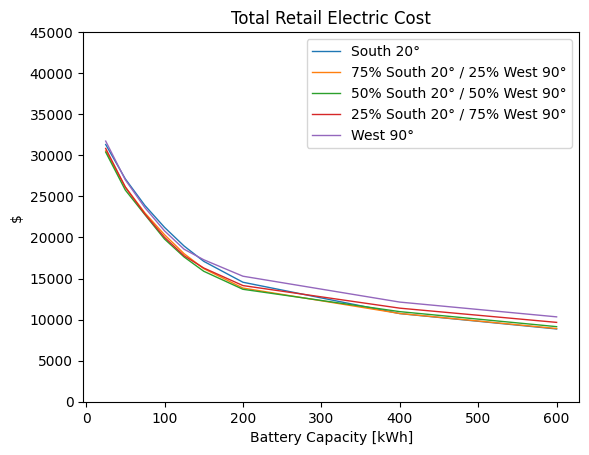

In [6]:
cols = ['s20','s20w90_75_25','s20w90_50_50','s20w90_25_75','w90']

fig = results[cols].plot( title='Total Retail Electric Cost',
                            ylabel='$',
                            xlabel='Battery Capacity [kWh]',
                            linewidth=1,
                            ylim=[0,45000],);

fig.legend(labels=['South 20°',
                   '75% South 20° / 25% West 90°',
                   '50% South 20° / 50% West 90°',
                   '25% South 20° / 75% West 90°',
                   'West 90°']);

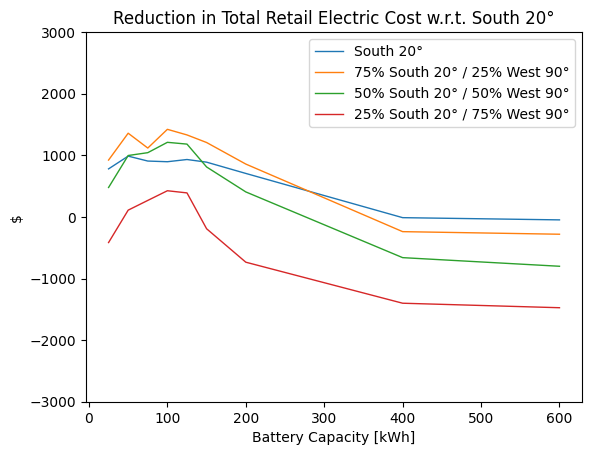

In [7]:
fig = results[[x+' red' for x in cols[1:]]].plot( title='Reduction in Total Retail Electric Cost w.r.t. South 20°',
                            ylabel='$',
                            xlabel='Battery Capacity [kWh]',
                            linewidth=1,
                            ylim=[-3000,3000],);

fig.legend(labels=['South 20°',
                   '75% South 20° / 25% West 90°',
                   '50% South 20° / 50% West 90°',
                   '25% South 20° / 75% West 90°',
                   'West 90°']);

## Solar 0.5x

In [8]:

results = reload_outputs(r'Output/caltech_ev_mjw14_solar0.5x_GPU_23-12-13_20-57-18.csv')
results.index.rename('Battery size (kWh)',inplace=True)
results.T

Battery size (kWh),25,50,75,100,125,150,200,400,600
s20,36430.0,32161.0,29096.0,26707.0,25042.0,23889.0,21827.0,18520.0,17477.0
s20w90_75_25,36170.0,31920.0,28951.0,26543.0,25072.0,23939.0,21903.0,18645.0,17642.0
s20w90_50_50,36198.0,32018.0,29072.0,26802.0,25241.0,24147.0,22127.0,18881.0,17911.0
s20w90_25_75,36376.0,32308.0,29393.0,27210.0,25708.0,24510.0,22412.0,19256.0,18289.0
w90,36918.0,32947.0,30197.0,27865.0,26278.0,25007.0,22865.0,19734.0,18684.0
s20w90_75_25 red,260.0,241.0,145.0,164.0,-30.0,-50.0,-76.0,-125.0,-165.0
s20w90_50_50 red,232.0,143.0,24.0,-95.0,-199.0,-258.0,-300.0,-361.0,-434.0
s20w90_25_75 red,54.0,-147.0,-297.0,-503.0,-666.0,-621.0,-585.0,-736.0,-812.0
w90 red,-488.0,-786.0,-1101.0,-1158.0,-1236.0,-1118.0,-1038.0,-1214.0,-1207.0
s20w90_75_25 red%,0.7,0.8,0.5,0.6,-0.1,-0.2,-0.3,-0.7,-0.9


## Solar 1.5x

In [9]:
results = reload_outputs(r'Output/caltech_ev_mjw14_solar1.5x_GPU_23-12-13_20-58-24.csv')
results.index.rename('Battery size (kWh)',inplace=True)
results.T

Battery size (kWh),25,50,75,100,125,150,200,400,600
s20,29779.0,25329.0,22017.0,19153.0,16871.0,14803.0,11376.0,5912.0,4258.0
s20w90_75_25,28819.0,24029.0,20749.0,17731.0,15287.0,13469.0,10451.0,5804.0,3996.0
s20w90_50_50,28439.0,23625.0,20228.0,17170.0,14660.0,12619.0,9829.0,5876.0,4107.0
s20w90_25_75,28569.0,23763.0,20192.0,17267.0,14702.0,12700.0,9900.0,6273.0,4354.0
w90,29449.0,24658.0,20961.0,18033.0,15560.0,13375.0,10707.0,6953.0,4825.0
s20w90_75_25 red,960.0,1300.0,1268.0,1422.0,1584.0,1334.0,925.0,108.0,262.0
s20w90_50_50 red,1340.0,1704.0,1789.0,1983.0,2211.0,2184.0,1547.0,36.0,151.0
s20w90_25_75 red,1210.0,1566.0,1825.0,1886.0,2169.0,2103.0,1476.0,-361.0,-96.0
w90 red,330.0,671.0,1056.0,1120.0,1311.0,1428.0,669.0,-1041.0,-567.0
s20w90_75_25 red%,3.2,5.1,5.8,7.4,9.4,9.0,8.1,1.8,6.2


## Solar 2x

In [10]:
results = reload_outputs(r'Output/caltech_ev_mjw14_solar2.0x_GPU_23-12-13_20-58-34.csv')
results.index.rename('Battery size (kWh)',inplace=True)
results.T

Battery size (kWh),25,50,75,100,125,150,200,400,600
s20,29078.0,24355.0,21002.0,18160.0,15993.0,13525.0,10122.0,3429.0,2304.0
s20w90_75_25,28160.0,23156.0,19972.0,16674.0,14003.0,12042.0,8814.0,3400.0,2360.0
s20w90_50_50,27872.0,22831.0,19171.0,16318.0,13432.0,11397.0,8098.0,3464.0,2428.0
s20w90_25_75,27806.0,22771.0,19009.0,15895.0,13414.0,11340.0,8225.0,3675.0,2550.0
w90,28388.0,23162.0,19556.0,16235.0,14014.0,11862.0,8611.0,4057.0,2774.0
s20w90_75_25 red,918.0,1199.0,1030.0,1486.0,1990.0,1483.0,1308.0,29.0,-56.0
s20w90_50_50 red,1206.0,1524.0,1831.0,1842.0,2561.0,2128.0,2024.0,-35.0,-124.0
s20w90_25_75 red,1272.0,1584.0,1993.0,2265.0,2579.0,2185.0,1897.0,-246.0,-246.0
w90 red,690.0,1193.0,1446.0,1925.0,1979.0,1663.0,1511.0,-628.0,-470.0
s20w90_75_25 red%,3.2,4.9,4.9,8.2,12.4,11.0,12.9,0.8,-2.4


# Etc

In [ ]:
r[['deltac']][k:].dropna().rolling(100).std().plot()

In [ ]:
r[r.fail==False].loc[k+1:].plot.scatter(x='th0',y='c',color='i',width=800,height=400)

In [ ]:
r[r.fail==False].loc[k+1:].plot.scatter(x='th1',y='c',color='i',width=800,height=400)

In [ ]:
r[r.fail==False].loc[k+1:].plot.scatter(x='th2',y='c',color='i',width=800,height=400)

In [ ]:
r.loc[k+1:][['th0','th1','c']].plot.scatter(x='th0',y='th1',color='c')

In [ ]:
r.loc[k+1:][['th0','th2','c']].plot.scatter(x='th0',y='th2',color='c')

## CF Shape

In [ ]:
import numpy as np

TH0 = np.empty((500,3))
TH0

array([[6.95171738e-310, 6.95171738e-310, 4.68937172e-310],
       [4.68937172e-310, 4.94065646e-324, 4.68937172e-310],
       [4.94065646e-324, 4.68937172e-310, 6.95165821e-310],
       ...,
       [6.95171692e-310, 6.95163184e-310, 6.95171692e-310],
       [6.95163184e-310, 6.95171692e-310, 6.95163184e-310],
       [6.95171692e-310, 6.95163180e-310, 6.95171692e-310]])

In [ ]:
import numpy as np

def shuffle_along_axis(a, axis=0):
    idx = np.random.rand(*a.shape).argsort(axis=axis)
    return np.take_along_axis(a,idx,axis=axis)


th012_values = np.empty((50**3,3))

i = 0
for th0 in [x for x in range(50)]:
    for th1 in [x for x in range(50)]:
        for th2 in [x for x in range(50)]:
            th012_values[i,0] = th0
            th012_values[i,1] = th1
            th012_values[i,2] = th2
            i += 1
            
th012_values = shuffle_along_axis(th012_values)

TH0 =  np.empty(50**3)
TH1 =  np.empty(50**3)
TH2 =  np.empty(50**3)
C =    np.empty(50**3)
FAIL = np.empty(50**3)

angle = 's20'
_df = df.loc[year_month][['load',f'solar_{angle}',f'netload_{angle}']].copy(deep=True)

for i in range(len(th012_values)):
    th0 = th012_values[i,0]
    th1 = th012_values[i,1]
    th2 = th012_values[i,2]

    if (th0>=th1) and (th0>=th2):
        fail,dispatch = peak_shaving_sim(   _df,
                                            f'netload_{angle}',
                                            100,
                                            [th0,th1,th2],
                                            TOU,
                                            utility_chg_max=100,)                
        cost = calc_cost(dispatch.utility,TOU)
        TH0[i] = th0
        TH1[i] = th1
        TH2[i] = th2
        C[i] = cost
        FAIL[i] = fail
        #print(i,th0,th1,th2,cost,fail)
    else:
        TH0[i] = th0
        TH1[i] = th1
        TH2[i] = th2
        C[i] = np.nan
        FAIL[i] = np.nan
        #print(i,th0,th1,th2,np.nan,np.nan)

In [ ]:
pd.DataFrame({'th0':TH0,'th1':TH1,'th2':TH2,'c':C,'fail':FAIL}).to_csv('CFshape.csv')

In [ ]:
import plotly.express as px

r = pd.DataFrame({'th0':TH0,'th1':TH1,'th2':TH2,'c':C,'fail':FAIL})

fig = px.scatter_3d(r, x='th0', y='th1', z='c',
              color='c')
fig.show()

In [ ]:
import plotly.express as px

r = pd.DataFrame({'th0':TH0,'th1':TH1,'th2':TH2,'c':C,'fail':FAIL})

fig = px.scatter_3d(r[r.th2==0], x='th0', y='th1', z='c',
              color='c')
fig.show()

In [ ]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np
from scipy.interpolate import griddata


#df = pd.read_csv('./test_data.csv')

rth01 = r[r.th2==0]

x = np.array(rth01.th0)
y = np.array(rth01.th1)
z = np.array(rth01.c)


xi = np.linspace(x.min(), x.max(), 100)
yi = np.linspace(y.min(), y.max(), 100)

X,Y = np.meshgrid(xi,yi)

Z = griddata((x,y),z,(X,Y), method='cubic')

fig = go.Figure(go.Surface(x=xi,y=yi,z=Z))
fig.show()

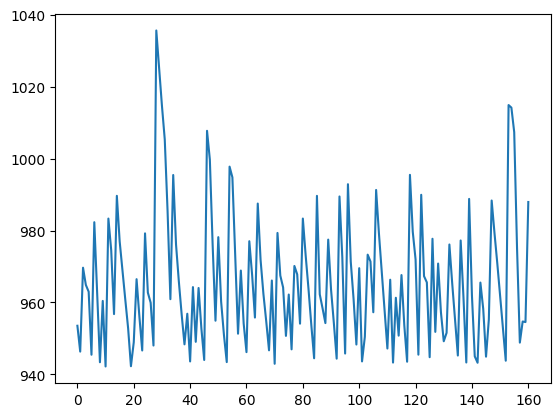

In [ ]:
plt.plot(c)

In [ ]:
r = pd.read_csv('CFshape.csv',index_col=0)
r = r[r.th2==0]
r = r.sort_values(['th0','th1'])
#r = r.sort_values('th1')
r.head(25)

,th0,th1,th2,c,fail
108640,0.0,0.0,0.0,2539.724706,1.0
82092,0.0,2.0,0.0,NaN,NaN
102988,0.0,2.0,0.0,NaN,NaN
82222,0.0,3.0,0.0,NaN,NaN
109015,0.0,3.0,0.0,NaN,NaN
74508,0.0,5.0,0.0,NaN,NaN
116422,0.0,5.0,0.0,NaN,NaN
49728,0.0,7.0,0.0,NaN,NaN
39407,0.0,8.0,0.0,NaN,NaN
85,0.0,9.0,0.0,NaN,NaN


MemoryError: Unable to allocate 4.55 TiB for an array with shape (250000000, 2500) and data type float64

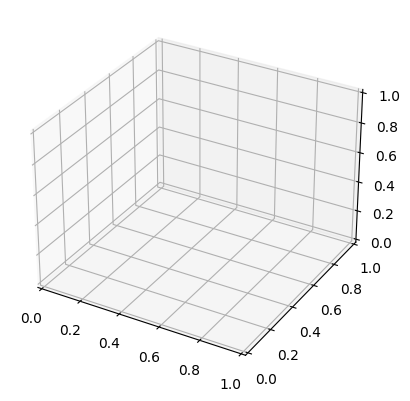

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

from matplotlib import cm
from matplotlib.ticker import LinearLocator

fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

r = pd.read_csv('CFshape.csv')

# Make data.
X = np.arange(0, 49, 1)
#X = np.array(r[r.th2==0].th0)
Y = np.arange(0, 49, 1)
#X = np.array(r[r.th2==0].th1)
X, Y = np.meshgrid(X, Y)
#R = np.sqrt(X**2 + Y**2)
#Z = np.sin(R)
Z = np.array(r[r.th2==0].c)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
#ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
# A StrMethodFormatter is used automatically
ax.zaxis.set_major_formatter('{x:.02f}')

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

plt.show()